# Train MSE Model

In [1]:
from loaders import *
from pipeline import *

train_loader, val_loader, test_loader = get_loaders(speech_dirs=["dev-clean.tar", "test-clean.tar"],
                                                    noise_dir="./wham_noise//wham_noise",
                                                    batch_size=64,
                                                    padding_strategy=None)

sample_batch = next(iter(val_loader))
mixed_waveforms, speech_waveforms = sample_batch

In [ ]:
from loaders import *
from pipeline import *

train_loader, val_loader, test_loader = get_loaders(speech_dirs=["dev-clean.tar", "test-clean.tar"],
                                                    noise_dir="./wham_noise//wham_noise",
                                                    batch_size=64,
                                                    padding_strategy=None)

sample_batch = next(iter(val_loader))
mixed_waveforms, speech_waveforms = sample_batch

encoder_attributes= dict(in_channels=2,
                        out_channels = [4, 8, 16, 32, 32, 64], 
                        kernel_sizes = [7, 5, 5, 3, 3, 3],
                        use_mobile = False,
                        act_func = nn.ReLU(),
                        do_bn = [True, True, True],
                        do_sc = [False, False, True],
                        dp = [0.2, 0.2],
                        num_blocks = 6)




decoder_attributes = dict(in_channels=64, 
                        out_channels = [64, 32, 32,16, 8, 1], 
                        kernel_sizes = [3, 3, 3,  5, 5, 7],
                        use_mobile = False,
                        act_func =nn.ReLU(),
                        do_bn = [True, True, True],
                        do_sc = [False, False, True], 
                        dp = [0.3, 0.4, 0.4],
                        num_blocks = 6)

stft_attributes = dict(n_fft = 2048, 
                    hop_length=112,
                    win_length=128,
                    window_fn=torch.hann_window, 
                    center=False,
                    normalized=False)

model_attributes = dict(
                    hidden_gru = 512,
                    encoder_parameters = encoder_attributes,
                    decoder_parameters = decoder_attributes)


input_signal_size = mixed_waveforms.shape[-1]

In [ ]:
# Config 2

encoder_attributes= dict(in_channels=2,
                        out_channels = [4, 16], 
                        kernel_sizes = [5, 3],
                        use_mobile = False,
                        act_func = nn.Tanh(),
                        do_bn = [True, True],
                        do_sc = [True, True],
                        dp = [0.2, 0.2],
                        num_blocks = 2)




decoder_attributes = dict(in_channels=16, 
                        out_channels = [8, 1], 
                        kernel_sizes = [5, 3],
                        use_mobile = False,
                        act_func =nn.Tanh(),
                        do_bn = [True, True],
                        do_sc = [True, True], 
                        dp = [0.2, 0.2],
                        num_blocks = 2)

stft_attributes = dict(n_fft = 3096, 
                    hop_length=112,
                    win_length=128,
                    window_fn=torch.hann_window, 
                    center=True,
                    normalized=False,
                    return_complex=True)

model_attributes = dict(
                    hidden_gru = 512,
                    encoder_parameters = encoder_attributes,
                    decoder_parameters = decoder_attributes)


input_signal_size = mixed_waveforms.shape[-1]

In [ ]:
from lightning.pytorch.callbacks import ModelCheckpoint
import torch.optim as optim
import torch.nn.functional as F
import librosa
import lightning as L

class SpectrogramLightningModel(L.LightningModule):
    def __init__(self, model_attributes, stft_attributes, input_signal_size = input_signal_size):
        super().__init__()
        
        
        self.stft = torchaudio.transforms.Spectrogram(**stft_attributes)
        dummy = torch.rand(1, 1, input_signal_size)
        dummy_shape = self.stft(dummy).shape[-2:]
        self.model = DenoisingModel(input_shape = dummy_shape,**model_attributes)
        self.mse = nn.SmoothL1Loss()
        
    def configure_optimizers(self):
        
        optimizer = optim.Adam(self.model.parameters(), lr=3.41e-4)
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=5, eta_min=1e-6)
        
        lr_scheduler_config = {
            "scheduler": scheduler,

            "interval": "epoch",

            "frequency": 1,
        }

        return [optimizer], [lr_scheduler_config]
    
    def configure_callbacks(self):
        checkpoint_callback = ModelCheckpoint(
            monitor="valid_loss",
            mode="max",
            save_top_k=1,
            filename="best-checkpoint-{epoch:02d}-{valid_loss:.2f}",
            save_last=True,
            every_n_epochs=1
        )
        return [checkpoint_callback]
    
    def training_step(self, batch):
        return self._step(batch, "train")

    def validation_step(self, batch):
        return self._step(batch, "valid")
    
    
    @staticmethod
    def spec_pad(model_output, spectrogram):

        if spectrogram.size(2) >= spectrogram.size(2) and spectrogram.size(3) >= spectrogram.size(3):
            padding_rows = spectrogram.size(2) - model_output.size(2)  
            padding_cols = spectrogram.size(3) - model_output.size(3)
            out = F.pad(model_output, (0, padding_cols, 0, padding_rows))  

        else:
            out = model_output[:, :, :spectrogram.shape[-2], :spectrogram.shape[-1]]
             
        return out
    

    def forward(self, mixed_waveforms, speech_waveforms):

        stft_clean = self.stft(speech_waveforms).to(self.device)
        stft_mixed = self.stft(mixed_waveforms).to(self.device)
        output = self.model(stft_mixed)
        
        if output.shape != stft_clean.shape:
            output = self.spec_pad(output, stft_clean)

        return output, stft_clean
    

    def _step(self, batch, kind):

        mixed_waveforms, speech_waveforms = batch
        output, stft_clean = self.forward(mixed_waveforms, speech_waveforms)
        
        loss = self.mse(output, stft_clean)
        
        metrics = {
            f"{kind}_loss": loss,
        }
        self.log_dict(
            metrics,
            prog_bar=True,
            logger=True,
            on_step=False,
            on_epoch=True)

        return loss

In [19]:
model = SpectrogramLightningModel(model_attributes=model_attributes,
                           stft_attributes=stft_attributes,
                           input_signal_size = input_signal_size)
trainer = L.Trainer(accelerator="auto",max_epochs=100,logger=True)                  
                            
                            

trainer.fit(model, train_loader, val_loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: ModelCheckpoint
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type           | Params | Mode 
-------------------------------------------------
0 | stft  | Spectrogram    | 0      | train
1 | model | DenoisingModel | 23.1 M | train
2 | mse   | SmoothL1Loss   | 0      | train
-------------------------------------------------
23.1 M    Trainable params
0         Non-trainable params
23.1 M    Total params
92.293    Total estimated model params size (MB)
41        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


# Without Gru

In [ ]:
# Config 2
import torch.nn as nn
import lightning as L
import torchaudio

from loaders import *
from pipeline import *

train_loader, val_loader, test_loader = get_loaders(speech_dirs=["dev-clean.tar", "test-clean.tar"],
                                                    noise_dir="./wham_noise//wham_noise",
                                                    batch_size=64,
                                                    padding_strategy=None)

sample_batch = next(iter(val_loader))
mixed_waveforms, speech_waveforms = sample_batch


encoder_attributes= dict(in_channels=2,
                        out_channels = [4, 8, 16, 32, 32, 64], 
                        kernel_sizes = [7, 5, 5, 3, 3, 3],
                        use_mobile = False,
                        act_func = nn.Tanh(),
                        do_bn = [True, True, True],
                        do_sc = [False, True, True],
                        dp = [0.2, 0.2],
                        num_blocks = 6)




decoder_attributes = dict(in_channels=64, 
                        out_channels = [32, 32, 16, 8, 4, 1], 
                        kernel_sizes = [3, 3, 3,  5, 5, 7],
                        use_mobile = False,
                        act_func =nn.Tanh(),
                        do_bn = [True, True, True],
                        do_sc = [False, True, True], 
                        dp = [0.3, 0.4, 0.4],
                        num_blocks = 6)

stft_attributes = dict(n_fft = 2046, 
                    hop_length=123,
                    win_length=256,
                    window_fn=torch.hann_window, 
                    center=False,
                    normalized=False)

model_attributes = dict(
                    encoder_parameters = encoder_attributes,
                    decoder_parameters = decoder_attributes)




In [2]:
import lightning as L
from lightning.pytorch.callbacks import ModelCheckpoint
import torch.optim as optim
import torch.nn.functional as F
import librosa

class SpectrogramLightningModelV2(L.LightningModule):
    def __init__(self, model_attributes, stft_attributes):
        super().__init__()
        
        
        self.stft = torchaudio.transforms.Spectrogram(**stft_attributes)
        self.model = DenoisingModelV2(**model_attributes)
        self.loss_fn = nn.SmoothL1Loss()
        
    def configure_optimizers(self):
        
        optimizer = optim.Adam(self.model.parameters(), lr=3.41e-4)
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=5, eta_min=1e-6)
        
        lr_scheduler_config = {
            "scheduler": scheduler,

            "interval": "epoch",

            "frequency": 1,
        }

        return [optimizer], [lr_scheduler_config]
    
    def configure_callbacks(self):
        checkpoint_callback = ModelCheckpoint(
            monitor="valid_loss",
            mode="max",
            save_top_k=1,
            filename="best-checkpoint-{epoch:02d}-{valid_loss:.2f}",
            save_last=True,
            every_n_epochs=1
        )
        return [checkpoint_callback]
    
    def training_step(self, batch):
        return self._step(batch, "train")

    def validation_step(self, batch):
        return self._step(batch, "valid")
    
    
    @staticmethod
    def spec_pad(model_output, spectrogram):

        if spectrogram.size(2) >= spectrogram.size(2) and spectrogram.size(3) >= spectrogram.size(3):
            padding_rows = spectrogram.size(2) - model_output.size(2)  
            padding_cols = spectrogram.size(3) - model_output.size(3)
            out = F.pad(model_output, (0, padding_cols, 0, padding_rows))  

        else:
            out = model_output[:, :, :spectrogram.shape[-2], :spectrogram.shape[-1]]
             
        return out
    

    def forward(self, mixed_waveforms, speech_waveforms):

        stft_clean = self.stft(speech_waveforms).to(self.device)
        stft_mixed = self.stft(mixed_waveforms).to(self.device)
        output = self.model(stft_mixed)
        
        if output.shape != stft_clean.shape:
            output = self.spec_pad(output, stft_clean)

        return output, stft_clean
    

    def _step(self, batch, kind):

        mixed_waveforms, speech_waveforms = batch
        output, stft_clean = self.forward(mixed_waveforms, speech_waveforms)
        
        loss = self.loss_fn(output, stft_clean)
        
        metrics = {
            f"{kind}_loss": loss,
        }
        self.log_dict(
            metrics,
            prog_bar=True,
            logger=True,
            on_step=False,
            on_epoch=True)

        return loss

In [22]:
model = SpectrogramLightningModelV2(model_attributes=model_attributes,
                           stft_attributes=stft_attributes)


stft = torchaudio.transforms.Spectrogram(n_fft = 2046, 
                    hop_length=123,
                    win_length=256,
                    window_fn=torch.hann_window, 
                    center=False,
                    normalized=False)

out = stft(mixed_waveforms.to('cpu')[:8, :, :]).to('cuda')

print('spectrogram shape: ', out.shape)
print('='*30)

sc = []
with torch.no_grad():
    encoder = model.model.encoder.to('cuda')
    decoder = model.model.decoder.to('cuda')

    for name, module in encoder.encoder_features.named_children():
        out = module(out)
        sc.append(out)
        print('encoder out', name, out.shape)
        
    sc = sc[:-1][::-1]
    print('='*30)
    for i, (name, module) in enumerate(decoder.decoder_features.named_children()):
        out = module(out)
        
        if i < len(sc):
            out += sc[i]
        print('decoder out', name, out.shape)

spectrogram shape:  torch.Size([8, 2, 1024, 1025])
encoder out layer_0 torch.Size([8, 4, 512, 512])
encoder out layer_1 torch.Size([8, 8, 256, 256])
encoder out layer_2 torch.Size([8, 16, 128, 128])
encoder out layer_3 torch.Size([8, 32, 64, 64])
encoder out layer_4 torch.Size([8, 32, 32, 32])
encoder out layer_5 torch.Size([8, 64, 16, 16])
decoder out layer_0 torch.Size([8, 32, 32, 32])
decoder out layer_1 torch.Size([8, 32, 64, 64])
decoder out layer_2 torch.Size([8, 16, 128, 128])
decoder out layer_3 torch.Size([8, 8, 256, 256])
decoder out layer_4 torch.Size([8, 4, 512, 512])
decoder out layer_5 torch.Size([8, 1, 1024, 1024])


In [ ]:
model = SpectrogramLightningModelV2(model_attributes=model_attributes,
                           stft_attributes=stft_attributes)
trainer = L.Trainer(accelerator="auto",max_epochs=100,logger=True)                  
                            
                            

trainer.fit(model, train_loader, val_loader)

# UnetLike

In [2]:
# Config 2

import lightning as L
import torchaudio

from loaders import *
from pipeline import *

train_loader, val_loader, test_loader = get_loaders(speech_dirs=["dev-clean.tar", "test-clean.tar"],
                                                    noise_dir="./wham_noise//wham_noise",
                                                    batch_size=64,
                                                    padding_strategy=None)

sample_batch = next(iter(val_loader))
mixed_waveforms, speech_waveforms = sample_batch

encoder_attributes= dict(in_channels=2,
                        out_channels = [8, 32, 32, 64, 64, 128, 128, 256], 
                        kernel_sizes = [9, 7, 7, 5, 5, 3, 3, 3],
                        use_mobile = True,
                        act_func = [nn.ELU()] * 6 + [nn.Tanh()] * 2 ,
                        do_bn = [True],
                        do_sc = [True],
                        dp = [0.2, 0.2, 0.4],
                        num_blocks = 8)




decoder_attributes = dict(in_channels=256, 
                        out_channels = [128, 128, 64, 64, 32, 32, 8, 1], 
                        kernel_sizes = [3, 3, 3, 5, 5, 7, 7, 9],
                        use_mobile = False,
                        act_func =nn.ELU(),
                        do_bn = [True],
                        do_sc = [True], 
                        dp = [0.3, 0.4, 0.4],
                        num_blocks = 8)

stft_attributes = dict(n_fft = 2046, 
                    hop_length=123,
                    win_length=256,
                    window_fn=torch.hann_window, 
                    center=False,
                    normalized=False, power = 1)

model_attributes = dict(
                    encoder_parameters = encoder_attributes,
                    decoder_parameters = decoder_attributes)

audio_len = mixed_waveforms.shape[-1]

In [3]:
from lightning.pytorch.callbacks import ModelCheckpoint
import torch.optim as optim
import torch.nn.functional as F
import librosa

class SpectrogramLightningModelUnet(L.LightningModule):
    def __init__(self, model_attributes, stft_attributes, audio_len = audio_len):
        super().__init__()
        
        
        self.stft = torchaudio.transforms.Spectrogram(**stft_attributes)
        self.model = DenoisingModelUnet(**model_attributes)
        self.loss_fn = nn.MSELoss()
        self.audio_len = audio_len
        
    def configure_optimizers(self):
        
        optimizer = optim.Adam(self.model.parameters(), lr=3.41e-4)
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=7, eta_min=1e-6)
        
        lr_scheduler_config = {
            "scheduler": scheduler,

            "interval": "epoch",

            "frequency": 1,
        }

        return [optimizer], [lr_scheduler_config]
    
    def configure_callbacks(self):
        checkpoint_callback = ModelCheckpoint(
            monitor="valid_loss",
            mode="max",
            save_top_k=1,
            filename="best-checkpoint-{epoch:02d}-{valid_loss:.2f}",
            save_last=True,
            every_n_epochs=1
        )
        return [checkpoint_callback]
    
    def training_step(self, batch):
        return self._step(batch, "train")

    def validation_step(self, batch):
        return self._step(batch, "valid")
    
    
    @staticmethod
    def spec_pad(model_output, spectrogram):

        if spectrogram.size(2) >= model_output.size(2) and spectrogram.size(3) >= model_output.size(3):
            padding_rows = spectrogram.size(2) - model_output.size(2)  
            padding_cols = spectrogram.size(3) - model_output.size(3)
            out = F.pad(model_output, (0, padding_cols, 0, padding_rows))  

        else:
            out = model_output[:, :, :spectrogram.shape[-2], :spectrogram.shape[-1]]
             
        return out
    
        
    def forward(self, mixed_waveforms, speech_waveforms):

        stft_clean = self.stft(speech_waveforms).to(self.device)
        stft_mixed = self.stft(mixed_waveforms).to(self.device)
        
        
        output = self.model(stft_mixed)
        
        if output.shape != stft_clean.shape:
            output = self.spec_pad(output, stft_clean)

        return output, stft_clean
    
    def run(self, mixed_waveforms):
        
        if isinstance(mixed_waveforms, np.ndarray):
            mixed_waveforms = torch.tensor(mixed_waveforms)
        if mixed_waveforms.ndim == 2:
            mixed_waveforms = mixed_waveforms.unsqueeze(0)
        if mixed_waveforms.ndim == 1:
            mixed_waveforms = mixed_waveforms.unsqueeze(0).unsqueeze(0)
        
        
        mixed_waveforms = mixed_waveforms[..., :self.audio_len]
        
        stft_mixed = self.stft(mixed_waveforms).to(self.device)
        spec_cleaned = self.model(stft_mixed)
        cleaned = librosa.istft(spec_cleaned.detach().cpu().numpy(), n_fft=self.stft.n_fft,hop_length=self.stft.hop_length,
                                win_length=self.stft.win_length, center=self.stft.center)
        return cleaned
    
    def _step(self, batch, kind):

        mixed_waveforms, speech_waveforms = batch
        output, stft_clean = self.forward(mixed_waveforms, speech_waveforms)
        
        loss = self.loss_fn(output, stft_clean)
        
        metrics = {
            f"{kind}_loss": loss,
        }
        self.log_dict(
            metrics,
            prog_bar=True,
            logger=True,
            on_step=False,
            on_epoch=True)

        return loss

In [6]:
stft = torchaudio.transforms.Spectrogram(**stft_attributes)
model = DenoisingModelUnet(**model_attributes)
model

/home/ysergaev/asr/asr_venv/lib/python3.10/site-packages/torchaudio/transforms/_transforms.py:94: UserWarning: `return_complex` argument is now deprecated and is not effective.`torchaudio.transforms.Spectrogram(power=None)` always returns a tensor with complex dtype. Please remove the argument in the function call.
  warnings.warn(


DenoisingModelUnet(
  (encoder): SpectrumEncoder(
    (encoder_features): Sequential(
      (layer_0): AdaptiveResBlock(
        (block): BaseBlock(
          (conv): Conv2d(2, 4, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
          (act): ELU(alpha=1.0)
          (bn): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (dropout): Dropout2d(p=0.2, inplace=False)
        )
        (scale): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (adapt_res): Conv2d(2, 4, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (layer_1): AdaptiveResBlock(
        (block): BaseBlock(
          (conv): Conv2d(4, 8, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
          (act): ELU(alpha=1.0)
          (bn): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (dropout): Dropout2d(p=0.2, inplace=False)
        )
        (scale): MaxPool2d(kernel_size=2, stride=2, padding=0, 

In [25]:
out = stft(mixed_waveforms.to('cpu')[:8, :, :]).to('cuda')

print('spectrogram shape: ', out.shape)
print('='*30)

sc = []
with torch.no_grad():
    encoder = model.encoder.to('cuda')
    decoder = model.decoder.to('cuda')
    for name, module in encoder.encoder_features.named_children():
        out = module(out)
        sc.append(out)
        print('encoder out', name, out.shape)
        
    sc = sc[:-1][::-1]
    print('='*30)
    for i, (name, module) in enumerate(decoder.decoder_features.named_children()):
        out = module(out)
        
        if i < len(sc):
            out += sc[i]
        print('decoder out', name, out.shape)

spectrogram shape:  torch.Size([8, 2, 1024, 1025])
encoder out layer_0 torch.Size([8, 4, 512, 512])
encoder out layer_1 torch.Size([8, 8, 256, 256])
encoder out layer_2 torch.Size([8, 16, 128, 128])
encoder out layer_3 torch.Size([8, 32, 64, 64])
encoder out layer_4 torch.Size([8, 32, 32, 32])
encoder out layer_5 torch.Size([8, 64, 16, 16])
decoder out layer_0 torch.Size([8, 32, 32, 32])
decoder out layer_1 torch.Size([8, 32, 64, 64])
decoder out layer_2 torch.Size([8, 16, 128, 128])
decoder out layer_3 torch.Size([8, 8, 256, 256])
decoder out layer_4 torch.Size([8, 4, 512, 512])
decoder out layer_5 torch.Size([8, 1, 1024, 1024])


In [3]:
model = SpectrogramLightningModelUnet(model_attributes=model_attributes,
                           stft_attributes=stft_attributes)
trainer = L.Trainer(accelerator="auto",max_epochs=1000,logger=True)                  
                            
                            

trainer.fit(model, train_loader, val_loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/ysergaev/asr/asr_venv/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: ModelCheckpoint


You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type               | Params | Mode 
-------------------------------------------------------
0 | stft    | Spectrogram        | 0      | train
1 | model   | DenoisingModelUnet | 1.9 M  | train
2 | loss_fn | MSELoss            | 0      | train
-------------------------------------------------------
1.9 M     Trainable params
0         Non-trainable params
1.9 M     Total params
7.405     Total estimated model params size (MB)
139       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/ysergaev/asr/asr_venv/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ysergaev/asr/asr_venv/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

# Unet RNN

In [1]:
import lightning as L
import torchaudio
from loaders import *
from pipeline import *

train_loader, val_loader, test_loader = get_loaders(speech_dirs=["dev-clean.tar", "test-clean.tar"],
                                                    noise_dir="./wham_noise//wham_noise",
                                                    batch_size=64,
                                                    padding_strategy=None)

sample_batch = next(iter(val_loader))
mixed_waveforms, speech_waveforms = sample_batch

encoder_attributes= dict(in_channels=2,
                        out_channels = [4, 8, 16, 32, 32, 64], 
                        kernel_sizes = [7, 5, 5, 3, 3, 3],
                        use_mobile = False,
                        act_func = nn.Tanh(),
                        do_bn = [True, True, True],
                        do_sc = [False, True, True],
                        dp = [0.2, 0.2],
                        num_blocks = 6)




decoder_attributes = dict(in_channels=64, 
                        out_channels = [32, 32, 16, 8, 4, 1], 
                        kernel_sizes = [3, 3, 3,  5, 5, 7],
                        use_mobile = False,
                        act_func =nn.Tanh(),
                        do_bn = [True, True, True],
                        do_sc = [False, True, True], 
                        dp = [0.3, 0.4, 0.4],
                        num_blocks = 6)

stft_attributes = dict(n_fft = 2046, 
                    hop_length=123,
                    win_length=256,
                    window_fn=torch.hann_window, 
                    center=False,
                    normalized=False)

model_attributes = dict(
                    encoder_parameters = encoder_attributes,
                    decoder_parameters = decoder_attributes,
                    hidden_gru= 256 )

In [3]:
from lightning.pytorch.callbacks import ModelCheckpoint
import torch.optim as optim
import torch.nn.functional as F
import librosa

class SpectrogramLightningModelV4(L.LightningModule):
    def __init__(self, model_attributes, stft_attributes, audio_len = mixed_waveforms.shape[-1]):
        super().__init__()
        
        
        self.stft = torchaudio.transforms.Spectrogram(**stft_attributes)
        dummy_input = torch.rand(1, audio_len)
        input_shape = self.stft(dummy_input).shape[-2:] 
        self.model = DenoisingModelUnetRNN(input_shape = input_shape, **model_attributes)
        self.loss_fn = nn.MSELoss()
        
    def configure_optimizers(self):
        
        optimizer = optim.Adam(self.model.parameters(), lr=3.41e-4)
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=5, eta_min=1e-6)
        
        lr_scheduler_config = {
            "scheduler": scheduler,

            "interval": "epoch",

            "frequency": 1,
        }

        return [optimizer], [lr_scheduler_config]
    
    def configure_callbacks(self):
        checkpoint_callback = ModelCheckpoint(
            monitor="valid_loss",
            mode="max",
            save_top_k=1,
            filename="best-checkpoint-{epoch:02d}-{valid_loss:.2f}",
            save_last=True,
            every_n_epochs=1
        )
        return [checkpoint_callback]
    
    def training_step(self, batch):
        return self._step(batch, "train")

    def validation_step(self, batch):
        return self._step(batch, "valid")
    
    
    @staticmethod
    def spec_pad(model_output, spectrogram):

        if spectrogram.size(2) >= spectrogram.size(2) and spectrogram.size(3) >= spectrogram.size(3):
            padding_rows = spectrogram.size(2) - model_output.size(2)  
            padding_cols = spectrogram.size(3) - model_output.size(3)
            out = F.pad(model_output, (0, padding_cols, 0, padding_rows))  

        else:
            out = model_output[:, :, :spectrogram.shape[-2], :spectrogram.shape[-1]]
             
        return out
    

    def forward(self, mixed_waveforms, speech_waveforms):

        stft_clean = self.stft(speech_waveforms).to(self.device)
        stft_mixed = self.stft(mixed_waveforms).to(self.device)
        output = self.model(stft_mixed)
        
        if output.shape != stft_clean.shape:
            output = self.spec_pad(output, stft_clean)

        return output, stft_clean
    

    def _step(self, batch, kind):

        mixed_waveforms, speech_waveforms = batch
        output, stft_clean = self.forward(mixed_waveforms, speech_waveforms)
        
        loss = self.loss_fn(output, stft_clean)
        
        metrics = {
            f"{kind}_loss": loss,
        }
        self.log_dict(
            metrics,
            prog_bar=True,
            logger=True,
            on_step=False,
            on_epoch=True)

        return loss

In [6]:
model = SpectrogramLightningModelV4(model_attributes=model_attributes,
                           stft_attributes=stft_attributes)
trainer = L.Trainer(accelerator="auto",max_epochs=1000,logger=True)                  
                            
                            

trainer.fit(model, train_loader, val_loader)

NameError: name 'SpectrogramLightningModelV4' is not defined

# Testing

In [12]:
model = SpectrogramLightningModelUnet.load_from_checkpoint('ep_130.ckpt',model_attributes=model_attributes,
                           stft_attributes=stft_attributes)
                                            

batch = next(iter(train_loader))
mixed_waveforms, speech_waveforms = batch
mixed_waveforms = mixed_waveforms.to('cuda')[:8, :, :]
speech_waveforms = speech_waveforms.to('cuda')[:8, :, :]

batch = mixed_waveforms, speech_waveforms

loss = model._step(batch, 'train')

cleaned, stft_clean = model.forward(*batch)

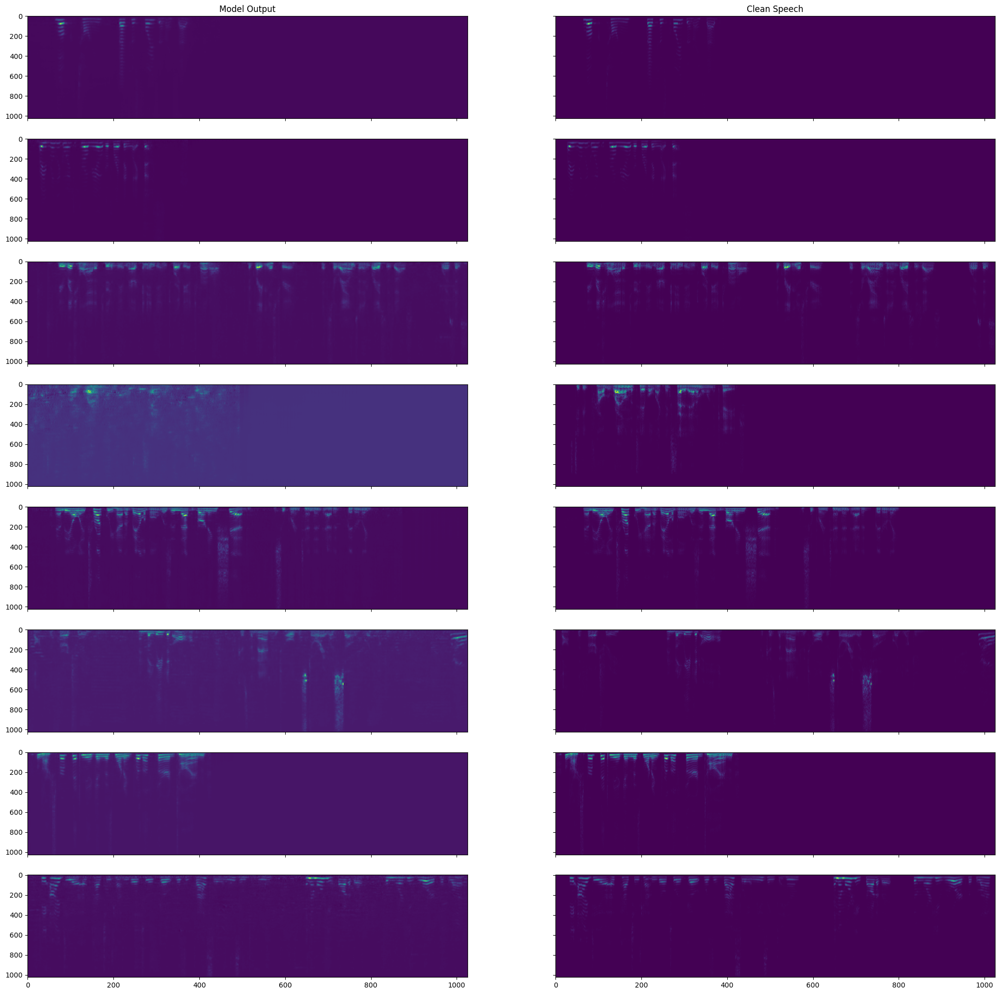

In [13]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(8, 2, figsize=(25, 25), sharex=True, sharey=True)
for i in range(8):
   
    axes[i, 0].imshow(cleaned[i, 0, :, :].detach().cpu().numpy(), aspect='auto', cmap='viridis')
    axes[0, 0].set_title('Model Output')
    axes[i, 1].imshow(stft_clean[i, 0, :, :].detach().cpu().numpy(), aspect='auto', cmap='viridis')
    axes[0, 1].set_title('Clean Speech')

In [14]:
model_attributes['encoder_parameters']['act_func'] = repr(model_attributes['encoder_parameters']['act_func'])
model_attributes['decoder_parameters']['act_func'] = repr(model_attributes['decoder_parameters']['act_func'])
stft_attributes['window_fn'] = repr(stft_attributes['window_fn'] ).split()[2]

save_dict = dict(model_attributes = model_attributes,
                stft_attributes=stft_attributes,
                audio_len = audio_len)

In [15]:
import yaml
import json
with open('config.json','w') as f:
    json.dump(save_dict, f)



In [34]:
import torch
import torch.nn.functional as F

trg = '0A23DEBA-0EED-409A-9E08-1B3910BD0969.wav'
path = '/home/ysergaev/asr/asr_dataset/audio/2024-04-22'
path_1 = os.path.join(path, trg)
audio = torchaudio.load(os.path.join(path_1))[0].to('cuda')[None, :]


cleaned = model.run(audio)

In [36]:
from IPython.display import Audio 
for i, cleaned_batch in enumerate(cleaned):
    print(f"--------------------\nsample {i} from batch")
    print(f"Input audio {i + 1}:")
    display(Audio(cleaned_batch, rate=train_loader.dataset.sample_rate, normalize=True))

--------------------
sample 0 from batch
Input audio 1:


In [ ]:
from IPython.display import Audio 
cleaned, stft_clean = model.forward(*batch)
s2 = librosa.istft(cleaned.detach().cpu().numpy(), n_fft=model.stft.n_fft,hop_length=model.stft.hop_length,
                    win_length=model.stft.win_length, center=model.stft.center)


for i, cleaned_batch in enumerate(s2):
    print(f"--------------------\nsample {i} from batch")
    print(f"Input audio {i + 1}:")
    display(Audio(cleaned_batch, rate=train_loader.dataset.sample_rate , normalize=True))
    

for i, cleaned_batch in enumerate(mixed_waveforms):
    cleaned_batch = cleaned_batch.detach().cpu().numpy()
    print(f"--------------------\nsample {i} from batch")
    print(f"Input audio {i + 1}:")
    display(Audio(cleaned_batch, rate=train_loader.dataset.sample_rate , normalize=True))

--------------------
sample 0 from batch
Input audio 1:


--------------------
sample 1 from batch
Input audio 2:


--------------------
sample 2 from batch
Input audio 3:


--------------------
sample 3 from batch
Input audio 4:


--------------------
sample 4 from batch
Input audio 5:


--------------------
sample 5 from batch
Input audio 6:


--------------------
sample 6 from batch
Input audio 7:


--------------------
sample 7 from batch
Input audio 8:


--------------------
sample 0 from batch
Input audio 1:


--------------------
sample 1 from batch
Input audio 2:


--------------------
sample 2 from batch
Input audio 3:


--------------------
sample 3 from batch
Input audio 4:


--------------------
sample 4 from batch
Input audio 5:


--------------------
sample 5 from batch
Input audio 6:


--------------------
sample 6 from batch
Input audio 7:


--------------------
sample 7 from batch
Input audio 8:


In [1]:
from lightning_module import *
from IPython.display import Audio 
model = SpectrogramLightningModelUnet.load_from_checkpoint('ep_130.ckpt',
                                                            model_attributes=model_attributes,
                                                            stft_attributes=stft_attributes)
audio,rate = torchaudio.load('example.wav')
denoised = model.run(audio)[0]

Audio(denoised[0], rate=rate , normalize=True)

# Train Mask Model

In [1]:
from loaders import *
from pipeline import *

train_loader, val_loader, test_loader = get_loaders(speech_dirs=["dev-clean.tar", "test-clean.tar"],
                                                    noise_dir="./wham_noise//wham_noise",
                                                    batch_size=8,
                                                    padding_strategy=None)

sample_batch = next(iter(val_loader))
mixed_waveforms, speech_waveforms = sample_batch

In [2]:
import lightning as L
import torchaudio

encoder_attributes= dict(in_channels=1,
                        out_channels = [4, 8, 16, 32, 32, 64, 64, 128], 
                        kernel_sizes = [9, 7, 7, 5, 5, 3, 3, 3],
                        use_mobile = False,
                        act_func = nn.ELU(),
                        do_bn = [True],
                        do_sc = [True],
                        dp = [0.2, 0.2],
                        num_blocks = 8)




decoder_attributes = dict(in_channels=128, 
                        out_channels = [64, 64, 32, 32, 16, 8, 4, 1], 
                        kernel_sizes = [3, 3, 3,  5, 5, 7, 7, 9],
                        use_mobile = False,
                        act_func =nn.ELU(),
                        do_bn = [True],
                        do_sc = [True], 
                        dp = [0.3, 0.4, 0.4],
                        num_blocks = 8)


stft_attributes = dict(n_fft = 2048, 
                    hop_length=112,
                    win_length=128,
                    window_fn=torch.hann_window, 
                    center=True,
                    normalized=False)

model_attributes = dict(
                    hidden_gru = 256,
                    encoder_parameters = encoder_attributes,
                    decoder_parameters = decoder_attributes)


input_signal_size = mixed_waveforms.shape[-1]

In [5]:
from lightning.pytorch.callbacks import ModelCheckpoint
import torch.optim as optim
import torch.nn.functional as F


class MaskLightningModel(L.LightningModule):
    def __init__(self, model_attributes, stft_attributes, input_signal_size):
        super().__init__()
        
        self.stft = torchaudio.transforms.Spectrogram(**stft_attributes,power=None)
        
        dummy = torch.rand(1, 1, input_signal_size)
        dummy_shape = self.stft(dummy).shape[-2:]
        self.model = DenoisingModel(input_shape = dummy_shape,**model_attributes)
        self.loss_fn = SiSDRLoss()
        self.istft = torchaudio.transforms.InverseSpectrogram(**stft_attributes)

        
    def configure_optimizers(self):
        
        optimizer = optim.AdamW(self.model.parameters(), lr=3.41e-4)
        scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=5, eta_min=1e-6)
        
        lr_scheduler_config = {
            "scheduler": scheduler,

            "interval": "epoch",

            "frequency": 1,
        }

        return [optimizer], [lr_scheduler_config]
    
    def configure_callbacks(self):
        checkpoint_callback = ModelCheckpoint(
            monitor="valid_loss",
            mode="max",
            save_top_k=1,
            filename="best-checkpoint-{epoch:02d}-{valid_loss:.2f}",
            save_last=True,
            every_n_epochs=1
        )
        return [checkpoint_callback]
    
    def training_step(self, batch):
        return self._step(batch, "train")

    def validation_step(self, batch):
        return self._step(batch, "valid")
    
    @staticmethod
    def spec_pad(model_output, spectrogram):

        if spectrogram.size(2) >= spectrogram.size(2) and spectrogram.size(3) >= spectrogram.size(3):
            padding_rows = spectrogram.size(2) - model_output.size(2)  
            padding_cols = spectrogram.size(3) - model_output.size(3)
            out = F.pad(model_output, (0, padding_cols, 0, padding_rows))  

        else:
            out = model_output[:, :, :spectrogram.shape[-2], :spectrogram.shape[-1]]
             

        return out
    
    @staticmethod
    def denoize_waveform_pad(denoized_wf, clear_wf):
        if clear_wf.shape[-1] > denoized_wf.shape[-1]:
            diff = clear_wf.shape[-1] - denoized_wf.shape[-1]
            out = F.pad(denoized_wf, pad=(0, diff))
            
        else:
            out = denoized_wf[:, :, :clear_wf.shape[-1]]
        
        return out
        

    def forward(self, mixed_waveforms):
        
        
        spectrogram = self.stft(mixed_waveforms)
        
        amplitude = torch.abs(spectrogram)
        angle = torch.angle(spectrogram)
        output = self.model(amplitude)
        
        
        if output.shape != spectrogram.shape:
            output = self.spec_pad(output, amplitude)

        
        masked = output * amplitude
        masked = torch.complex(masked, angle)
        denoised = self.istft(masked)
        pad_for_audio = self.denoize_waveform_pad(denoised, mixed_waveforms)
        return pad_for_audio
    

    def _step(self, batch, kind):

        mixed_waveforms, speech_waveforms = batch
        mixed_waveforms = mixed_waveforms[:, 0, None, :]

        output = self.forward(mixed_waveforms)
        
        loss = self.loss_fn(output, speech_waveforms)
        
        metrics = {
            f"{kind}_loss": loss,
        }
        self.log_dict(
            metrics,
            prog_bar=True,
            logger=True,
            on_step=True,
            on_epoch=True)

        return loss

In [6]:
model = MaskLightningModel(model_attributes=model_attributes,
                           stft_attributes=stft_attributes,
                           input_signal_size = input_signal_size)
trainer = L.Trainer(accelerator="auto",max_epochs=100,logger=True)                  
                            
                            

trainer.fit(model, train_loader, val_loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: ModelCheckpoint
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type               | Params | Mode 
-------------------------------------------------------
0 | stft    | Spectrogram        | 0      | train
1 | model   | DenoisingModel     | 3.0 M  | train
2 | loss_fn | SiSDRLoss          | 0      | train
3 | istft   | InverseSpectrogram | 0      | train
-------------------------------------------------------
3.0 M     Trainable params
0         Non-trainable params
3.0 M     Total params
12.155    Total estimated model params size (MB)
126       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/ysergaev/asr/asr_venv/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.
/home/ysergaev/asr/asr_venv/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

# Test Mask

In [6]:
model = MaskLightningModel.load_from_checkpoint('/home/ysergaev/asr/denoising/lightning_logs/version_16/checkpoints/last.ckpt',model_attributes=model_attributes,
                           stft_attributes=stft_attributes,input_signal_size = input_signal_size)

batch = next(iter(train_loader))
mixed_waveforms, speech_waveforms = batch
mixed_waveforms = mixed_waveforms.to('cuda')[:8,0,None, :]
speech_waveforms = speech_waveforms.to('cuda')[:8, :, :]

batch = mixed_waveforms, speech_waveforms

loss = model._step(batch, 'train')

cleaned = model.forward(mixed_waveforms)

/home/ysergaev/asr/asr_venv/lib/python3.10/site-packages/lightning/pytorch/core/module.py:441: You are trying to `self.log()` but the `self.trainer` reference is not registered on the model yet. This is most likely because the model hasn't been passed to the `Trainer`


In [27]:
stft = torchaudio.transforms.Spectrogram()
stft(mixed_waveforms.cpu()).ndim #.shape, stft(mixed_waveforms.cpu()).dtype

4

In [9]:
from IPython.display import Audio 

for i, cleaned_batch in enumerate(cleaned):
    print(f"--------------------\nsample {i} from batch")
    print(f"Input audio {i + 1}:")
    display(Audio(cleaned_batch.detach().cpu().numpy(), rate=train_loader.dataset.sample_rate))

--------------------
sample 0 from batch
Input audio 1:


--------------------
sample 1 from batch
Input audio 2:


--------------------
sample 2 from batch
Input audio 3:


--------------------
sample 3 from batch
Input audio 4:


--------------------
sample 4 from batch
Input audio 5:


--------------------
sample 5 from batch
Input audio 6:


--------------------
sample 6 from batch
Input audio 7:


--------------------
sample 7 from batch
Input audio 8:
